# Figures

This notebook generates figures for the SatRain manuscript.

In [1]:
%load_ext autoreload
%autoreload 2
import hdf5plugin
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from satrain.plotting import set_style, cmap_precip, cmap_tbs
set_style()

## Number of training samples

We plot the number of training samples to ensure that the trainingset covers the training and testing periods continuously. Note that a reduction of files during testing is expected because those files are kept as single collocation files.


## GMI

In [9]:
import numpy as np
from satrain.utils import get_median_time
from satrain.config import get_data_path
from pathlib import Path

data_path = get_data_path()
gmi_collocs = sorted(data_path.glob("**/gridded/**/gmi_*.nc"))
gmi_times_gridded = np.array([get_median_time(path) for path in gmi_collocs], dtype="datetime64")
print(f"Total number of gridded GMI samples: {len(gmi_collocs)}.")
gmi_collocs = sorted(data_path.glob("**/on_swath/**/gmi_*.nc"))
gmi_times_on_swath = np.array([get_median_time(path) for path in gmi_collocs], dtype="datetime64")
print(f"Total number of on-swath GMI samples: {len(gmi_collocs)}.")

Total number of gridded GMI samples: 66394.
Total number of on-swath GMI samples: 156052.


In [10]:
np.argmax(gmi_times_gridded)

4121

(17532.0, 19601.0)

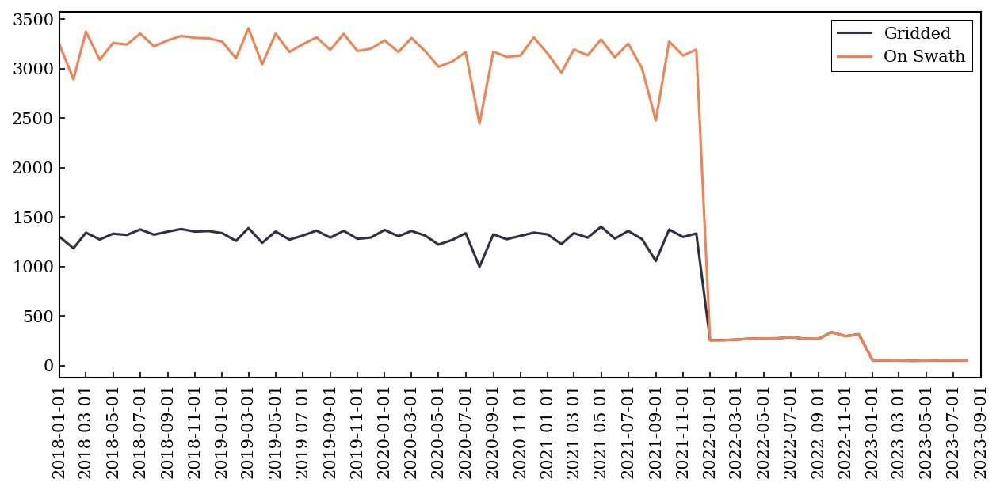

In [11]:
f, ax = plt.subplots(1, 1, figsize=(10, 4))

start_time = gmi_times_gridded.min().astype("datetime64[M]")
end_time = gmi_times_gridded.max().astype("datetime64[M]")
bins = np.arange(start_time, end_time + np.timedelta64(1, "M"), np.timedelta64(1, "M"))
x = bins[:-1] + 0.5 * (bins[1:] - bins[:-1])

gmi_counts_gridded = np.histogram(gmi_times_gridded, bins)[0]
ax.plot(x, gmi_counts_gridded, label="Gridded")

gmi_counts_on_swath = np.histogram(gmi_times_on_swath, bins)[0]
ax.plot(x, gmi_counts_on_swath, label="On Swath")

ax.set_xticks(bins[::2])
for l in ax.xaxis.get_ticklabels():
    l.set_rotation(90)
plt.legend()
ax.set_xlim(start_time, end_time)

## ATMS

In [12]:
import numpy as np
from satrain.utils import get_median_time
from satrain.config import get_data_path
from pathlib import Path

data_path = get_data_path()
atms_collocs = sorted(data_path.glob("**/gridded/**/atms_*.nc"))
atms_times_gridded = np.array([get_median_time(path) for path in atms_collocs], dtype="datetime64")
print(f"Total number of gridded atms samples: {len(atms_collocs)}.")
atms_collocs = sorted(data_path.glob("**/on_swath/**/atms_*.nc"))
atms_times_on_swath = np.array([get_median_time(path) for path in atms_collocs], dtype="datetime64")
print(f"Total number of on-swath atms samples: {len(atms_collocs)}.")

Total number of gridded atms samples: 142536.
Total number of on-swath atms samples: 34316.


(17532.0, 19601.0)

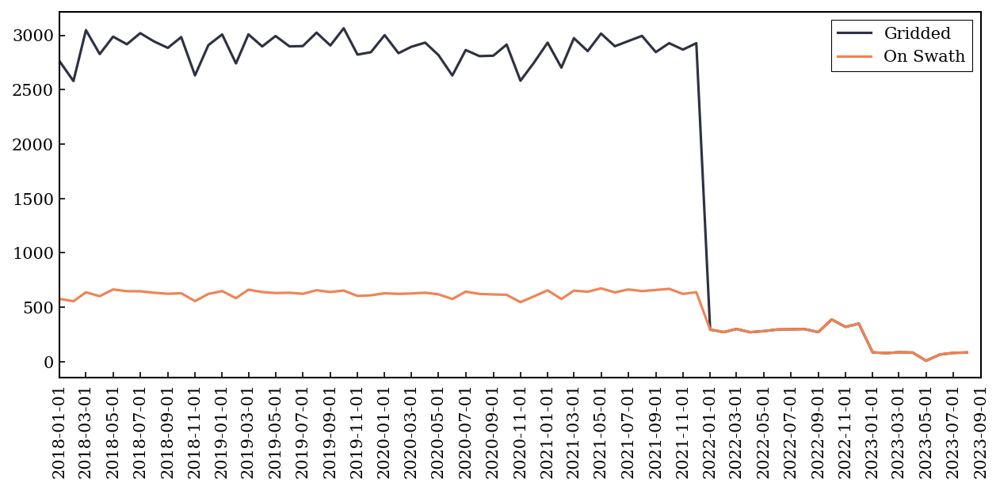

In [13]:
f, ax = plt.subplots(1, 1, figsize=(10, 4))

start_time = atms_times_gridded.min().astype("datetime64[M]")
end_time = atms_times_gridded.max().astype("datetime64[M]")
bins = np.arange(start_time, end_time + np.timedelta64(1, "M"), np.timedelta64(1, "M"))
x = bins[:-1] + 0.5 * (bins[1:] - bins[:-1])

atms_counts_gridded = np.histogram(atms_times_gridded, bins)[0]
ax.plot(x, atms_counts_gridded, label="Gridded")

atms_counts_on_swath = np.histogram(atms_times_on_swath, bins)[0]
ax.plot(x, atms_counts_on_swath, label="On Swath")

ax.set_xticks(bins[::2])
for l in ax.xaxis.get_ticklabels():
    l.set_rotation(90)
plt.legend()
ax.set_xlim(start_time, end_time)

## Observation overview

In [14]:
from satrain.utils import get_median_time
from pansat.products.satellite.goes import l1b_goes_16_rad_all_conus

raw_data_path = Path("/data1/ipwgml/raw_new/")

input_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="input_data")
ref_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="reference_data")
geo_ir_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="geo_ir")
geo_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="geo")
time = get_median_time(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc")

In [15]:
from PIL import Image
from pyresample.geometry import SwathDefinition
from satpy import Scene

lons = input_data.longitude.data
lats = input_data.latitude.data
lons, lats = np.meshgrid(lons, lats)
swath = SwathDefinition(xr.DataArray(lons), xr.DataArray(lats))

if not Path("goes_true_color.png").exists():
    goes_recs = l1b_goes_16_rad_all_conus.get(time)
    scene = Scene([rec.local_path for rec in goes_recs])
    scene.load(["true_color", "C01"])
    area = scene.coarsest_area()
    scene_r = scene.resample(swath)
    scene_r.save_dataset("true_color", "goes_true_color.png")
img = Image.open("goes_true_color.png")

## Observation overview

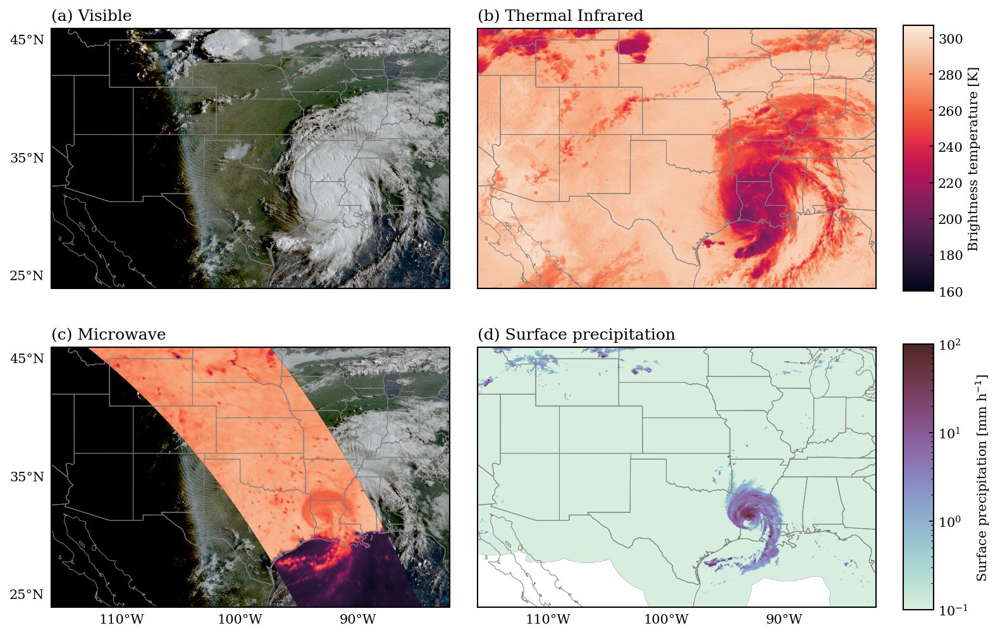

In [17]:
import cartopy.feature as cfeature
from matplotlib.gridspec import GridSpec
from satrain.plotting import add_ticks, cmap_tbs
from speed.grids import GLOBAL
from matplotlib.colors import LogNorm

gs = GridSpec(2, 3, width_ratios=[1.0, 1.0, 0.075], height_ratios=[1.0, 1.0], wspace=0.1)
fig = plt.figure(figsize=(12, 8))

row_slice = slice(ref_data.lower_left_row, ref_data.lower_left_row + ref_data.latitude.size)
col_slice = slice(ref_data.lower_left_col, ref_data.lower_left_col + ref_data.longitude.size)
grid = GLOBAL.grid[row_slice, col_slice]
crs = grid.to_cartopy_crs()
ext = grid.area_extent
ext = (ext[0], ext[2], ext[1], ext[3])

ax = fig.add_subplot(gs[0, 0], projection=crs)
ax.imshow(img, extent=ext)
add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=True, bottom=False)
ax.coastlines(color="grey")
ax.add_feature(cfeature.BORDERS, edgecolor="grey")
ax.add_feature(cfeature.STATES, edgecolor="grey")
ax.set_title("(a) Visible", loc="left")
ax.set_xlim(-116, lons.max())
ax.set_ylim(24, 46)

ax = fig.add_subplot(gs[0, 1], projection=crs)
m = ax.imshow(geo_ir_data.tbs_ir[4], extent=ext, cmap=cmap_tbs, vmin=160)
add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=False, bottom=False)
ax.coastlines(color="grey")
ax.add_feature(cfeature.BORDERS, edgecolor="grey")
ax.add_feature(cfeature.STATES, edgecolor="grey")
ax.set_title("(b) Thermal Infrared", loc="left")
cax = fig.add_subplot(gs[0, 2])
ax.set_xlim(-116, lons.max())
ax.set_ylim(24, 46)
plt.colorbar(m, label="Brightness temperature [K]", orientation="vertical", cax=cax)

ax = fig.add_subplot(gs[1, 0], projection=crs)
ax.imshow(img, extent=ext, cmap=cmap_tbs)
m = ax.imshow(input_data.observations.data[..., 6], extent=ext, cmap=cmap_tbs, norm=m.norm)
add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=True, bottom=True)
ax.set_title("(c) Microwave", loc="left")
ax.coastlines(color="grey")
ax.set_xlim(-116, lons.max())
ax.set_ylim(24, 46)
ax.add_feature(cfeature.BORDERS, edgecolor="grey")
ax.add_feature(cfeature.STATES, edgecolor="grey")

ax = fig.add_subplot(gs[1, 1], projection=crs)
norm_precip = LogNorm(1e-1, 1e2)
m = ax.imshow(np.maximum(ref_data.surface_precip, 1e-3), extent=ext, cmap=cmap_precip, norm=norm_precip)
add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=False, bottom=True)
ax.set_title("(d) Surface precipitation", loc="left")
cax = fig.add_subplot(gs[1, 2])
ax.coastlines(color="grey")
ax.set_xlim(-116, lons.max())
ax.set_ylim(24, 46)
ax.add_feature(cfeature.BORDERS, edgecolor="grey")
ax.add_feature(cfeature.STATES, edgecolor="grey")
plt.colorbar(m, label="Surface precipitation [mm h$^{-1}$]", orientation="vertical", cax=cax)

fig.savefig("../figures/fig01.png", dpi=200, bbox_inches="tight")

In [26]:
from satrain.utils import get_median_time
from pansat.products.satellite.goes import l1b_goes_16_rad_all_conus

raw_data_path = Path("/data1/ipwgml/raw_new/")
input_data_gmi = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="input_data")
ref_data_gmi = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="reference_data")

raw_data_path = Path("/data1/ipwgml/raw/")
input_data_atms = xr.load_dataset(raw_data_path / "atms/gridded/mrms_atms_20200827083917.nc", group="input_data")
ref_data_atms = xr.load_dataset(raw_data_path / "atms/gridded/mrms_atms_20200827083917.nc", group="reference_data")
input_data_atms = input_data_atms.interp(latitude=input_data_gmi.latitude, longitude=input_data_gmi.longitude)
ref_data_atms = ref_data_atms.interp(latitude=ref_data_gmi.latitude, longitude=ref_data_gmi.longitude)

In [27]:
input_data_gmi_os = xr.load_dataset("/data1/ipwgml/raw_new/gmi/on_swath/mrms_gmi_20200827124136.nc", group="input_data")

0 5
1 7
2 12


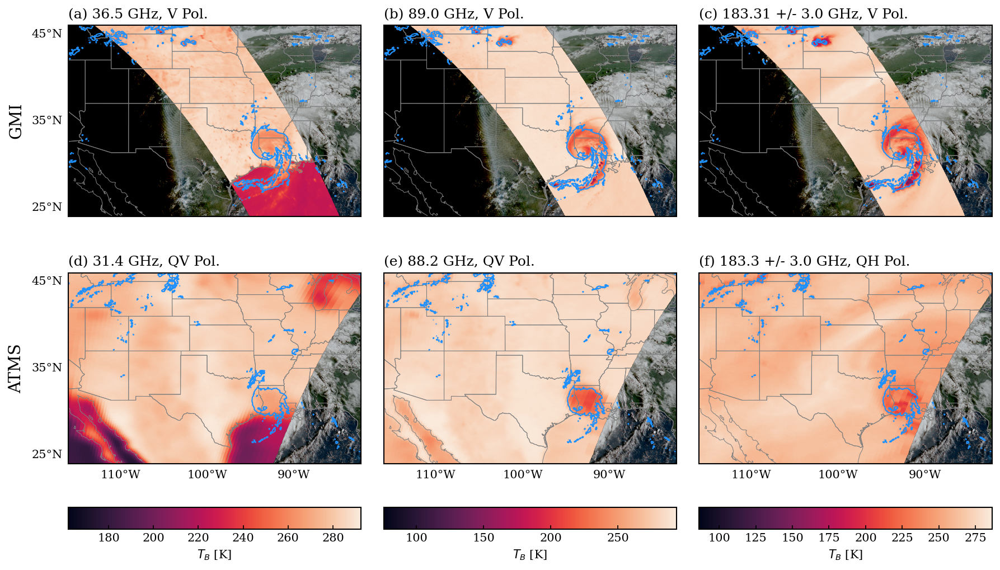

In [30]:
import cartopy.feature as cfeature
from matplotlib.gridspec import GridSpec
from satrain.plotting import add_ticks, cmap_tbs
from speed.grids import GLOBAL

from matplotlib.colors import Normalize

atms_channels = [0, 1, 2, 3, 6]
atms_channels = [1, 2, 6]
gmi_channels = [5, 7, 12]

n_panels = len(atms_channels)
gs = GridSpec(3, 1 + n_panels, width_ratios=[0.1] + [1.0] * n_panels, wspace=0.1, height_ratios=[1.0, 1.0, 0.1])
fig = plt.figure(figsize=(5 * n_panels, 8))

chan_names_atms = [
    #"23.8 GHz, QV Pol.",
    "31.4 GHz, QV Pol.",
    "88.2 GHz, QV Pol.",
    #"165.5 GHz, QH Pol.",
    "183.3 +/- 3.0 GHz, QH Pol."
]

chan_names_gmi = [
    #"23.8 GHz, V Pol.",
    "36.5 GHz, V Pol.",
    "89.0 GHz, V Pol.",
    #"166.5 GHz, H Pol.",
    "183.31 +/- 3.0 GHz, V Pol."
]

mins =  [
    min(input_data_gmi.observations[..., chan_gmi].min(), input_data_atms.observations[..., chan_atms].min())
    for chan_gmi, chan_atms in zip(gmi_channels, atms_channels)
]
maxs =  [
    max(input_data_gmi.observations[..., chan_gmi].max(), input_data_atms.observations[..., chan_atms].max())
    for chan_gmi, chan_atms in zip(gmi_channels, atms_channels)
]
norms = [
    Normalize(mn, mx) for mn, mx in zip(mins, maxs)
]

row_slice = slice(ref_data_gmi.lower_left_row, ref_data_gmi.lower_left_row + ref_data_gmi.latitude.size)
col_slice = slice(ref_data_gmi.lower_left_col, ref_data_gmi.lower_left_col + ref_data_gmi.longitude.size)
#row_slice = slice(ref_data_atms.lower_left_row, ref_data_atms.lower_left_row + ref_data_atms.latitude.size)
#col_slice = slice(ref_data_atms.lower_left_col, ref_data_atms.lower_left_col + ref_data_atms.longitude.size)
grid = GLOBAL.grid[row_slice, col_slice]

crs = grid.to_cartopy_crs()
ext = grid.area_extent
ext = (ext[0], ext[2], ext[1], ext[3])

ax = fig.add_subplot(gs[0, 0])
ax.set_axis_off()
ax.text(0, 0, "GMI", rotation=90, va="center", ha="center", fontsize=14)
ax.set_ylim(-2, 2)

cntr_clr = "dodgerblue"

for ind, chan in enumerate(gmi_channels):
    ax = fig.add_subplot(gs[0, ind + 1], projection=crs)
    ax.imshow(img, extent=ext)
    sp = ref_data_gmi.surface_precip.data
    ax.contour(sp, levels=[1.0], extent=ext, origin="upper", linewidths=1.0, colors=cntr_clr)
    m = ax.imshow(input_data_gmi.observations[..., chan], extent=ext, cmap=cmap_tbs, norm=norms[ind])
    
    add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=ind==0, bottom=False)
    ax.coastlines(color="grey")
    ax.add_feature(cfeature.BORDERS, edgecolor="grey")
    ax.add_feature(cfeature.STATES, edgecolor="grey")
    ax.set_title(f"({chr(ord('a') + ind)}) {chan_names_gmi[ind]}", loc="left")
    ax.set_xlim(-116, lons.max())
    ax.set_ylim(24, 46)
    
ax = fig.add_subplot(gs[1, 0])
ax.set_axis_off()
ax.text(0, 0, "ATMS", rotation=90, va="center", ha="center", fontsize=14)
ax.set_ylim(-2, 2)

for ind, chan in enumerate(atms_channels):
    ax = fig.add_subplot(gs[1, ind + 1], projection=crs)
    ax.imshow(img, extent=ext)
    sp = ref_data_atms.surface_precip.data
    ax.contour(sp, levels=[1.0], extent=ext, origin="upper", linewidths=1.0, colors=cntr_clr)
    m = ax.imshow(input_data_atms.observations[..., chan], extent=ext, cmap=cmap_tbs, norm=norms[ind])
    add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=ind==0, bottom=True)
    ax.coastlines(color="grey")
    ax.add_feature(cfeature.BORDERS, edgecolor="grey")
    ax.add_feature(cfeature.STATES, edgecolor="grey")
    ax.set_title(f"({chr(ord('a') + ind + n_panels)}) {chan_names_atms[ind]}", loc="left")
    ax.set_xlim(-116, lons.max())
    ax.set_ylim(24, 46)
    
    cax = fig.add_subplot(gs[2, ind + 1])
    plt.colorbar(m, cax=cax, label="$T_B$ [K]", orientation="horizontal")

fig.savefig("../figures/fig02.png", dpi=200, bbox_inches="tight") 

In [ ]:
blue = geo_data.observations[:, :, 0, 0]
red = geo_data.observations[:, :, 0, 1]
nir = geo_data.observations[:, :, 0, 2]

# Normalize to 0–1 for RGB visualization
def normalize(x, min_val, max_val):
    return np.clip((x - min_val) / (max_val - min_val), 0, 1)

red_norm = normalize(red, 0, np.nanmax(red))
blue_norm = normalize(blue, 0, np.nanmax(blue))
nir_norm = normalize(nir, 0, np.nanmax(nir))

green_norm = 0.45 * red_norm + 0.1 * blue_norm + 0.45 * nir_norm

## Scene extraction

In [31]:
training_scenes_gridded = sorted(list(Path("/data1/ipwgml/example/gridded//").glob("**/ancillary*.nc")))
training_scenes_on_swath = sorted(list(Path("/data1/ipwgml/example/on_swath/").glob("**/ancillary*.nc")))

In [32]:
training_scenes_gridded = sorted(list(Path("/data1/ipwgml/example/gridded//").glob("**/ancillary*.nc")))
training_scenes_on_swath = sorted(list(Path("/data1/ipwgml/example/on_swath//").glob("**/ancillary*.nc")))
line_width = 1.0
line_color = "grey"
highlight_color = "k"

def add_scene_outlines(ax, highlight_gridded=-1, highlight_on_swath=-1, gridded=True, on_swath=True):
    """
    Add outlines of extracted training scenes to panel.
    """
    if gridded:
        for scene_ind, scene in enumerate(training_scenes_gridded):
            with xr.open_dataset(scene) as scene:
                lons = scene.longitude.data
                lats = scene.latitude.data
                lons, lats = np.meshgrid(lons, lats)
                lons = np.concatenate([lons[:, 0], lons[-1, :], lons[::-1, -1], lons[0, ::-1]])
                lats = np.concatenate([lats[:, 0], lats[-1, :], lats[::-1, -1], lats[0, ::-1]])
                color = line_color if highlight_gridded != scene_ind else highlight_color
                lw = line_width if highlight_gridded != scene_ind else 2.0 * line_width
                ax.plot(lons, lats, c=color, ls="-", lw=lw)

    if on_swath:
        for scene_ind, scene in enumerate(training_scenes_on_swath):
            with xr.open_dataset(scene) as scene:
                lons = scene.longitude.data
                lats = scene.latitude.data
                lons = np.concatenate([lons[:, 0], lons[-1, :], lons[::-1, -1], lons[0, ::-1]])
                lats = np.concatenate([lats[:, 0], lats[-1, :], lats[::-1, -1], lats[0, ::-1]])
                color = line_color if highlight_on_swath != scene_ind else highlight_color
                lw = line_width if highlight_on_swath != scene_ind else 2.0 * line_width
                ax.plot(lons, lats, c=color, ls="-", lw=lw)

In [36]:
ind_on_swath = 0
str(training_scenes_on_swath[ind_on_swath]).replace("ancillary", "target")

'/data1/ipwgml/example/on_swath/target/2020/08/27/target_20200827123531.nc'

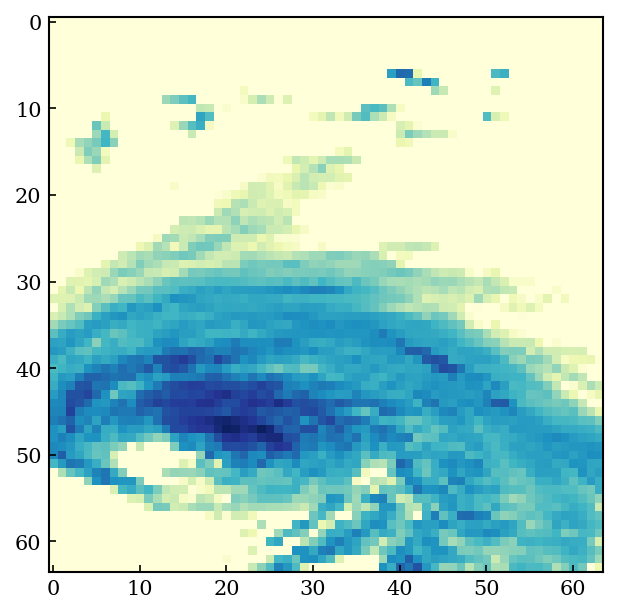

In [35]:
from matplotlib.colors import LogNorm

ind_on_swath = 21
norm = LogNorm(1e-1, 1e2)

data = xr.load_dataset(str(training_scenes_on_swath[ind_on_swath]).replace("ancillary", "target"), engine="h5netcdf")
plt.imshow(np.maximum(data.surface_precip, 1e-3), norm=norm)

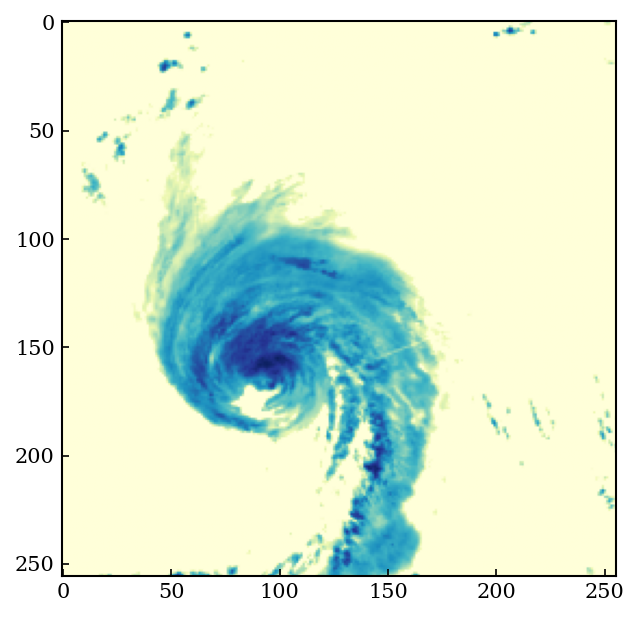

In [36]:
from matplotlib.colors import LogNorm

ind_gridded = 9 
norm = LogNorm(1e-1, 1e2)

data = xr.load_dataset(str(training_scenes_gridded[ind_gridded]).replace("ancillary", "target"), engine="h5netcdf")
plt.imshow(np.maximum(data.surface_precip, 1e-3), norm=norm)

In [110]:
from math import trunc, ceil
import cmocean
from cartopy import crs as ccrs
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize
from satrain.plotting import cmap_tbs, cmap_precip
from satrain.plotting import add_ticks
import cartopy.feature as cfeature

crs = ccrs.PlateCarree()

fig = plt.figure(figsize=(14.5, 6.5))
gs = GridSpec(12, 18, wspace=0.8, hspace=1.2)
norm_pmw = Normalize(180, 300)
norm_geo = Normalize(180, 300)
norm_ir = Normalize(200, 320)
norm_precip = LogNorm(1e-1, 1e2)

scene_gridded = ind_gridded
scene_on_swath = ind_on_swath

#
# Full scene
#

ax = fig.add_subplot(gs[0:6, 0:6], projection=crs)
lons = ref_data.longitude.data
lats = ref_data.latitude.data
lon_min, lon_max = lons.min(), lons.max()
lat_min, lat_max = lats.min(), lats.max() - 2
lon_ticks = np.arange(trunc(lon_min // 5) * 5.0, ceil(lon_max // 5) * 5 + 1.0, 5.0)
lat_ticks = np.arange(trunc(lat_min // 5) * 5.0, ceil(lat_max // 5) * 5 + 1.0, 5.0)


ax.imshow(img, extent=ext)
ax.pcolormesh(lons, lats, input_data.observations[..., 5], cmap=cmap_tbs, norm=norm_pmw)
ax.coastlines()
add_scene_outlines(ax, on_swath=False)
ax.set_xlim(lon_min, lon_max)
ax.set_ylim(lat_min, lat_max)
ax.set_title("(a) GPM GMI obs.")
add_ticks(ax, lon_ticks, lat_ticks, left=True, bottom=False)
ax.set_ylabel(r"Latitude [$^\circ N$]")
ax.set_xlim(-116, -82.269)
ax.set_ylim(24, 46)

ax = fig.add_subplot(gs[0:6, 6:12], projection=crs)
ax.pcolormesh(lons, lats, geo_data.observations[..., 0, 8], cmap=cmap_tbs, norm=norm_geo)
ax.coastlines()
add_scene_outlines(ax, highlight_gridded=scene_gridded, on_swath=False)
ax.set_xlim(lon_min, lon_max)
ax.set_ylim(lat_min, lat_max)
ax.set_title("(b) GOES 16 obs.")
add_ticks(ax, lon_ticks, lat_ticks, left=False, bottom=False)
ax.set_ylabel(r"Latitude [$^\circ N$]")
ax.set_xlim(-116, -82.269)
ax.set_ylim(24, 46)

ax = fig.add_subplot(gs[6:12, 0:6], projection=crs)
ax.pcolormesh(lons, lats, geo_ir_data.tbs_ir[8], cmap=cmap_tbs, norm=norm_ir)
ax.coastlines()
add_scene_outlines(ax, gridded=False)
ax.set_xlim(lon_min, lon_max)
ax.set_ylim(lat_min, lat_max)
ax.set_title("(c) Gridded IR obs.")
add_ticks(ax, lon_ticks, lat_ticks, left=True, bottom=True)
ax.set_xlabel(r"Longitude [$^\circ$]")
ax.set_ylabel(r"Latitude [$^\circ$]")
ax.set_xlim(-116, -82.269)
ax.set_ylim(24, 46)

ax = fig.add_subplot(gs[6:12, 6:12], projection=crs)
ax.pcolormesh(lons, lats, np.maximum(ref_data.surface_precip, 1e-3), cmap=cmap_precip, norm=norm_precip)
ax.coastlines()
add_scene_outlines(ax, highlight_on_swath=scene_on_swath, gridded=False)
ax.set_xlim(lon_min, lon_max)
ax.set_ylim(lat_min, lat_max)
ax.set_title("(d) MRMS surface precipitation")
add_ticks(ax, lon_ticks, lat_ticks, left=False, bottom=True)
ax.set_xlabel(r"Longitude [$^\circ$]")
ax.set_xlim(-116, -82.269)
ax.set_ylim(24, 46)

#
# Gridded training scenes
#

ref_data_s = xr.load_dataset(str(training_scenes_gridded[scene_gridded]).replace("ancillary", "target"), engine="h5netcdf")
input_data_s = xr.load_dataset(str(training_scenes_gridded[scene_gridded]).replace("ancillary", "gmi"), engine="h5netcdf")
geo_data_s = xr.load_dataset(str(training_scenes_gridded[scene_gridded]).replace("ancillary", "geo"), engine="h5netcdf")
geo_ir_data_s = xr.load_dataset(str(training_scenes_gridded[scene_gridded]).replace("ancillary", "geo_ir"), engine="h5netcdf")

ax = fig.add_subplot(gs[0:3, 12:18])
ax.set_axis_off()
ax.set_title("(e) Gridded training samples", loc="left")

ax = fig.add_subplot(gs[0:3, 12:15])
lons = ref_data_s.longitude.data
lats = ref_data_s.latitude.data
lon_min, lon_max = lons.min(), lons.max()
lat_min, lat_max = lats.min(), lats.max()

ax.imshow(input_data_s.observations[..., 5], cmap=cmap_tbs, norm=norm_pmw)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

ax = fig.add_subplot(gs[0:3, 15:18])
ax.imshow(geo_data_s.observations[0, 8], cmap=cmap_tbs, norm=norm_geo)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

ax = fig.add_subplot(gs[3:6, 12:15])
ax.imshow(geo_ir_data_s.observations[8], cmap=cmap_tbs, norm=norm_ir)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

ax = fig.add_subplot(gs[3:6, 15:18])
ax.imshow(np.maximum(ref_data_s.surface_precip, 1e-3), cmap=cmap_precip, norm=norm_precip)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

#
# Native training scenes
#

ax = fig.add_subplot(gs[6:12, 12:18])
ax.set_axis_off()
ax.set_title("(f) On-swath training samples", loc="left")

ref_data_s = xr.load_dataset(str(training_scenes_on_swath[scene_on_swath]).replace("ancillary", "target"), engine="h5netcdf")
input_data_s = xr.load_dataset(str(training_scenes_on_swath[scene_on_swath]).replace("ancillary", "gmi"), engine="h5netcdf")
geo_data_s = xr.load_dataset(str(training_scenes_on_swath[scene_on_swath]).replace("ancillary", "geo"), engine="h5netcdf")
geo_ir_data_s = xr.load_dataset(str(training_scenes_on_swath[scene_on_swath]).replace("ancillary", "geo_ir"), engine="h5netcdf")

ax = fig.add_subplot(gs[6:9, 12:15])
lon_min, lon_max = lons.min(), lons.max()
lat_min, lat_max = lats.min(), lats.max()

ax.imshow(input_data_s.observations[..., 5], cmap=cmap_tbs, norm=norm_pmw)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

ax = fig.add_subplot(gs[6:9, 15:18])
ax.imshow(geo_data_s.observations[0, 8], cmap=cmap_tbs, norm=norm_geo)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

ax = fig.add_subplot(gs[9:12, 12:15])
ax.imshow(geo_ir_data_s.observations[8], cmap=cmap_tbs, norm=norm_ir)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

ax = fig.add_subplot(gs[9:12, 15:18])
ax.imshow(np.maximum(ref_data_s.surface_precip, 1e-3), cmap=cmap_precip, norm=norm_precip)
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect(1.0)

fig.savefig("../figures/fig08.png", dpi=200, bbox_inches="tight")

## GEO

In [42]:
import xarray as xr

raw_data_path = Path("/data1/ipwgml/raw_new/")
geo_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="geo")
ref_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="reference_data")
anc_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="ancillary_data")
row_slice = slice(ref_data.lower_left_row, ref_data.lower_left_row + ref_data.latitude.size)
col_slice = slice(ref_data.lower_left_col, ref_data.lower_left_col + ref_data.longitude.size)
grid = GLOBAL.grid[row_slice, col_slice]

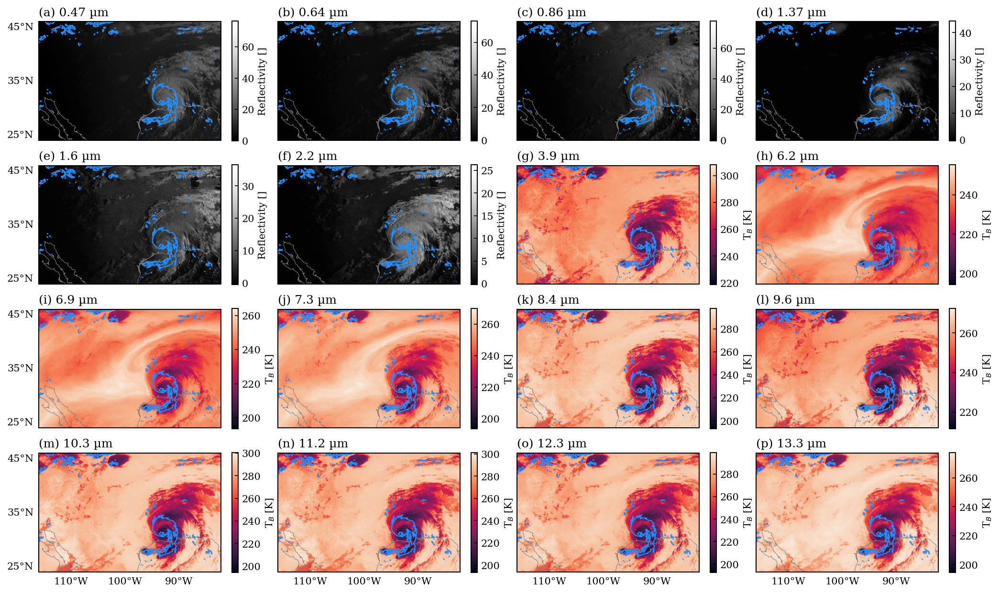

In [43]:
gs = GridSpec(4, 4, wspace=0.05)
fig = plt.figure(figsize=(17, 10))

crs = grid.to_cartopy_crs()
ext = grid.area_extent
ext = (ext[0], ext[2], ext[1], ext[3])

variables = list(anc_data.variables)
plt.rcParams['text.usetex'] = False

goes16_abi_wavelengths = [
    "0.47 µm",   # Channel 1 - Blue
    "0.64 µm",   # Channel 2 - Red
    "0.86 µm",   # Channel 3 - Near-IR (Veg)
    "1.37 µm",   # Channel 4 - Cirrus
    "1.6 µm",    # Channel 5 - Snow/Ice
    "2.2 µm",    # Channel 6 - Cloud Particle Size
    "3.9 µm",    # Channel 7 - Shortwave IR
    "6.2 µm",    # Channel 8 - Upper-Level Water Vapor
    "6.9 µm",    # Channel 9 - Mid-Level Water Vapor
    "7.3 µm",    # Channel 10 - Lower-Level Water Vapor
    "8.4 µm",    # Channel 11 - Cloud-Top Phase
    "9.6 µm",    # Channel 12 - Ozone
    "10.3 µm",   # Channel 13 - Clean IR Longwave Window
    "11.2 µm",   # Channel 14 - IR Longwave Window
    "12.3 µm",   # Channel 15 - Dirty IR Longwave Window
    "13.3 µm"    # Channel 16 - CO₂ Longwave (Cloud-Top Height)
]


for row in range(4):
    for col in range(4):
        ind = row * 4 + col
        if ind > 15:
            break

        ax = fig.add_subplot(gs[row, col], projection=crs)

        if ind < 6:
            cmap = "Greys_r"
        else:
            cmap = cmap_tbs
            
        m = ax.imshow(geo_data.observations[..., 4, ind].data, extent=ext, cmap=cmap)
        sp = ref_data.surface_precip.data
        ax.contour(sp, levels=[1.0], extent=ext, origin="upper", linewidths=1.0, colors=cntr_clr)
        ax.set_title(rf"({chr(ord('a') + ind)}) {goes16_abi_wavelengths[ind]}")
        ax.coastlines(color="grey")
        add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=col==0, bottom=row==3)
        
        ax.set_xlim(-116, -82.269)
        ax.set_ylim(24, 46)
        
        if ind < 6:
            label = "Reflectivity []"
        else:
            label = "T$_B$ [K]"
        plt.colorbar(m, label=label)
        ind += 1

fig.savefig("../figures/fig03.png", dpi=200, bbox_inches="tight")

## Ancillary

In [45]:
import xarray as xr

raw_data_path = Path("/data1/ipwgml/raw_new/")
anc_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="ancillary_data")
ref_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="reference_data")
row_slice = slice(ref_data.lower_left_row, ref_data.lower_left_row + ref_data.latitude.size)
col_slice = slice(ref_data.lower_left_col, ref_data.lower_left_col + ref_data.longitude.size)
grid = GLOBAL.grid[row_slice, col_slice]

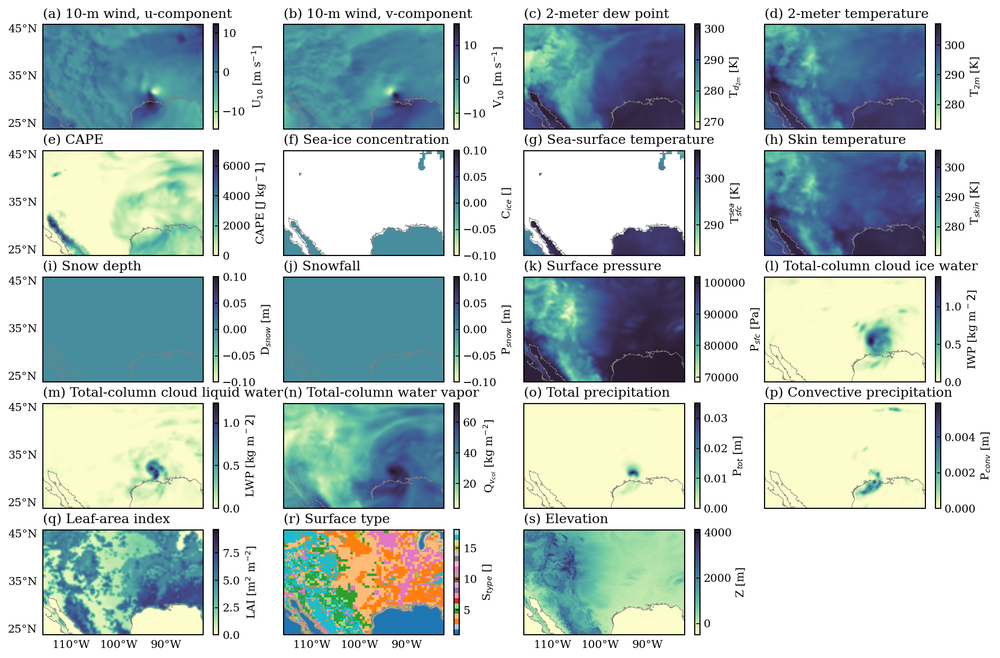

In [46]:
gs = GridSpec(5, 4)
fig = plt.figure(figsize=(15, 10))

crs = grid.to_cartopy_crs()
ext = grid.area_extent
ext = (ext[0], ext[2], ext[1], ext[3])

variables = list(anc_data.variables)
names = [
    "10-m wind, u-component",
    "10-m wind, v-component",
    "2-meter dew point",
    "2-meter temperature",
    "CAPE",
    "Sea-ice concentration",
    "Sea-surface temperature",
    "Skin temperature",
    "Snow depth",
    "Snowfall",
    "Surface pressure",
    "Total-column cloud ice water",
    "Total-column cloud liquid water",
    "Total-column water vapor",
    "Total precipitation",
    "Convective precipitation",
    "Leaf-area index",
    "Surface type",
    "Elevation"
]

variables_with_units = [
    "U$_{10}$ [m s$^{-1}$]",
    "V$_{10}$ [m s$^{-1}$]",
    "T$_{d_{2m}}$ [K]",
    "T$_{2m}$ [K]",
    "CAPE [J kg$^-1$]",
    "C$_{ice}$ []",
    "T$_{sfc}^{sea}$ [K]",
    "T$_{skin}$ [K]",
    "D$_{snow}$ [m]",
    "P$_{snow}$ [m]",
    "P$_{sfc}$ [Pa]",
    "IWP [kg m$^-2$]",
    "LWP [kg m$^-2$]",
    "Q$_{v_{col}}$ [kg m$^{-2}$]",
    "P$_{tot}$ [m]",
    "P$_{conv}$ [m]",
    "LAI [m$^2$ m$^{-2}$]",
    "S$_{type}$ []",
    "Z [m]"
]

plt.rcParams['text.usetex'] = False


ind = 0
for var in variables:
    if var in ["latitude", "longitude", "time"]:
        continue
    row = ind // 4
    col = ind % 4

    ax = fig.add_subplot(gs[row, col], projection=crs)

    cmap = "cmo.deep"
    if var == "surface_type":
        cmap = "tab20"
    
    m = ax.imshow(anc_data[var].data, extent=ext, cmap=cmap)
    #ax.set_title(f"({chr(ord('a') + ind)}) {var}")
    sp = ref_data.surface_precip.data
    #ax.contour(sp, levels=[1.0], extent=ext, origin="upper", linewidths=0.5, colors=cntr_clr)
    ax.set_title(rf"({chr(ord('a') + ind)}) {names[ind]}")
    
    ax.coastlines(color="grey")
    plt.colorbar(m, label=variables_with_units[ind])
    
    add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=col==0, bottom=row==4)
    
    ax.set_xlim(-116, -82.269)
    ax.set_ylim(24, 46)

    ind += 1

fig.savefig("../figures/fig04.png", dpi=200, bbox_inches="tight")

## Reference data

In [48]:
import xarray as xr

raw_data_path = Path("/data1/ipwgml/raw_new/")
ref_data = xr.load_dataset(raw_data_path / "gmi/gridded/mrms_gmi_20200827124136.nc", group="reference_data")
row_slice = slice(ref_data.lower_left_row, ref_data.lower_left_row + ref_data.latitude.size)
col_slice = slice(ref_data.lower_left_col, ref_data.lower_left_col + ref_data.longitude.size)
grid = GLOBAL.grid[row_slice, col_slice]

In [60]:
import seaborn as sns
from satrain.plotting import set_style
sns.reset_orig()
set_style()

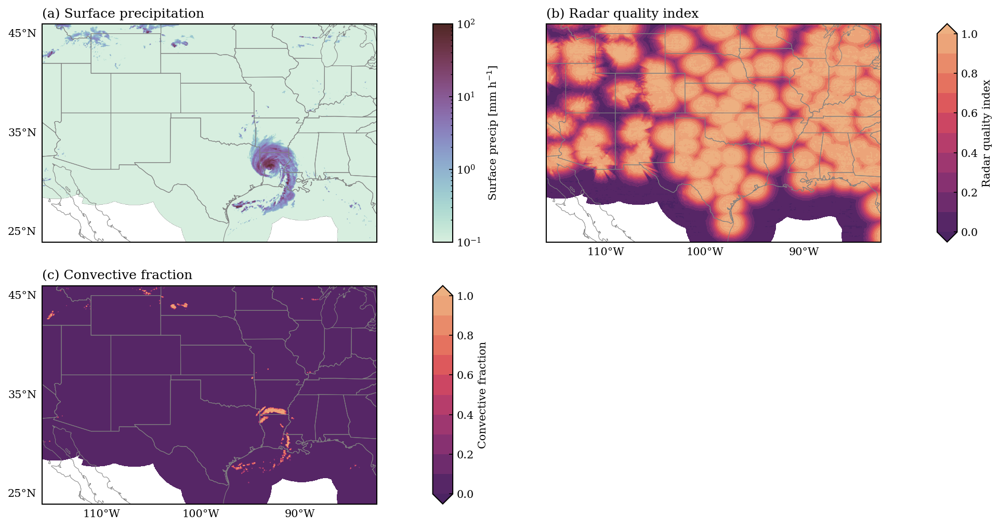

In [61]:
gs = GridSpec(2, 4, width_ratios=[1.0, 0.05, 1.0, 0.05], wspace=0.2)
fig = plt.figure(figsize=(16, 8))

crs = grid.to_cartopy_crs()
ext = grid.area_extent
ext = (ext[0], ext[2], ext[1], ext[3])
norm_precip = LogNorm(1e-1, 1e2)

ax = fig.add_subplot(gs[0, 0], projection=crs)
m = ax.imshow(np.maximum(ref_data.surface_precip, 1e-2), extent=ext, norm=norm_precip, cmap=cmap_precip)
ax.coastlines(color="grey")
ax.add_feature(cfeature.BORDERS, edgecolor="grey")
ax.add_feature(cfeature.STATES, edgecolor="grey")
ax.set_title("(a) Surface precipitation")
ax.set_xlim(-116, -82.269)
ax.set_ylim(24, 46)
add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=True, bottom=False)

cax = fig.add_subplot(gs[0, 1])
plt.colorbar(m, label="Surface precip [mm h$^{-1}$]", cax=cax, pad=-0.1)
pos = cax.get_position()
cax.set_position([pos.x0 - 0.015, pos.y0, pos.width, pos.height]) 

ax = fig.add_subplot(gs[0, 2], projection=crs)
m = ax.contourf(ref_data.radar_quality_index, extent=ext, cmap="flare_r", levels=np.linspace(0, 1, 11), origin="upper", extend="both")
ax.coastlines(color="grey")
ax.add_feature(cfeature.BORDERS, edgecolor="grey")
ax.add_feature(cfeature.STATES, edgecolor="grey")
ax.set_title("(b) Radar quality index")
ax.set_xlim(-116, -82.269)
ax.set_ylim(24, 46)

cax = fig.add_subplot(gs[0, 3])
plt.colorbar(m, label="Radar quality index", cax=cax)
pos = cax.get_position()
cax.set_position([pos.x0 - 0.015, pos.y0, pos.width, pos.height]) 
add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=False, bottom=True)

ax = fig.add_subplot(gs[1, 0], projection=crs)
m = ax.contourf(np.maximum(ref_data.convective_fraction, 1e-3), extent=ext, cmap="flare_r", levels=np.linspace(0, 1, 11), origin="upper", extend="both")
ax.coastlines(color="grey")
ax.add_feature(cfeature.BORDERS, edgecolor="grey")
ax.add_feature(cfeature.STATES, edgecolor="grey")
ax.set_title("(c) Convective fraction")
ax.set_xlim(-116, -82.269)
ax.set_ylim(24, 46)
add_ticks(ax=ax, lons=[-110, -100, -90], lats=[25, 35, 45], left=True, bottom=True)

cax = fig.add_subplot(gs[1, 1])
plt.colorbar(m, label="Convective fraction", cax=cax)
pos = cax.get_position()
cax.set_position([pos.x0 - 0.015, pos.y0, pos.width, pos.height]) 

fig.savefig("../figures/fig05.png", dpi=200, bbox_inches="tight")
fig

## Additional verification data

In [63]:
raw_data_korea = Path("/data1/ipwgml/korea/raw")
gmi_data_kma = xr.load_dataset(raw_data_korea / "gmi/gridded/kma_gmi_20230809181739.nc", group="input_data")
geo_data_kma = xr.load_dataset(raw_data_korea / "gmi/gridded/kma_gmi_20230809181739.nc", group="geo")
ref_data_kma = xr.load_dataset(raw_data_korea / "gmi/gridded/kma_gmi_20230809181739.nc", group="reference_data")

In [64]:
raw_data_austria = Path("/data1/ipwgml/austria/raw")
gmi_data_wegener = xr.load_dataset(raw_data_austria / "gmi/gridded/wegener_net_gmi_20220605225438.nc", group="input_data")[{"longitude": slice(122, -120), "latitude": slice(122, -120)}]
geo_data_wegener = xr.load_dataset(raw_data_austria / "gmi/gridded/wegener_net_gmi_20220605225438.nc", group="geo")[{"longitude": slice(122, -120), "latitude": slice(122, -120)}]
ref_data_wegener = xr.load_dataset(raw_data_austria / "gmi/gridded/wegener_net_gmi_20220605225438.nc", group="reference_data")[{"longitude": slice(122, -120), "latitude": slice(122, -120)}]

In [66]:
from pyresample.geometry import AreaDefinition
import numpy as np

# Define grid parameters
lat_min, lat_max = 46.7, 47.1
lon_min, lon_max = 15.7, 16.1
resolution = 0.005  # in degrees

# Compute number of grid points
n_lats = int(round((lat_max - lat_min) / resolution)) + 1
n_lons = int(round((lon_max - lon_min) / resolution)) + 1

# Generate lats and lons
lats = np.linspace(lat_min, lat_max, n_lats)
lons = np.linspace(lon_min, lon_max, n_lons)

# Meshgrid
lon_grid, lat_grid = np.meshgrid(lons, lats)

# Create AreaDefinition
area_def = AreaDefinition(
    area_id='custom_latlon_grid',
    description='Regular lat-lon grid 0.001 deg res',
    proj_id='latlon',
    projection={'proj': 'latlong', 'datum': 'WGS84'},
    width=n_lons,
    height=n_lats,
    area_extent=(lon_min, lat_min, lon_max, lat_max)
)

In [67]:
from pansat import TimeRange
from pansat.environment import get_index
from pansat.products.stations.wegener_net import station_data
idx = get_index(station_data)
granules = idx.find(TimeRange("2022-06-05T22:54:00"))

[16:50:38] WARNING  Found table named 'dem.copernicus' in database but could not load find a           ]8;id=192856;file:///home/simon/src/pansat/pansat/catalog/index.py\index.py]8;;\:]8;id=336429;file:///home/simon/src/pansat/pansat/catalog/index.py#268\268]8;;\
                    corresponding pansat product.                                                                  

In [68]:
wegener_data = []
for granule in granules:
    data = granule.open()
    if "latitude" in data.dims:
        continue
    wegener_data.append(data)
wegener_data = xr.concat(wegener_data, dim="stations")
wegener_data = wegener_data.interp(time=np.datetime64("2022-06-05T22:54:38"), method="nearest")

In [69]:
from pansat.geometry import LonLatRect
from pansat.products.dem.globe import globe

roi = LonLatRect(lon_min, lat_min, lon_max, lat_max)
recs = globe.get("2022-01-01", roi=roi)
elev = recs[0].open()
lons, lats = area_def.get_lonlats()
elev = elev.interp(longitude=lons[0], latitude=lats[:, 0])

In [70]:
from matplotlib.colors import LogNorm, Normalize

In [72]:
wegener_data.longitude.min().data, wegener_data.longitude.max().data, wegener_data.latitude.min().data, wegener_data.latitude.max().data

(array(15.75885995),
 array(16.04087807),
 array(46.86614107),
 array(46.99766091))

In [102]:
from satrain.plotting import download_blue_marble
from PIL import Image
bm_file = Path("blue_marble_hires.jpg")
if not bm_file.exists():
    download_blue_marble(bm_file)
Image.MAX_IMAGE_PIXELS = None
bm = Image.open(bm_file)

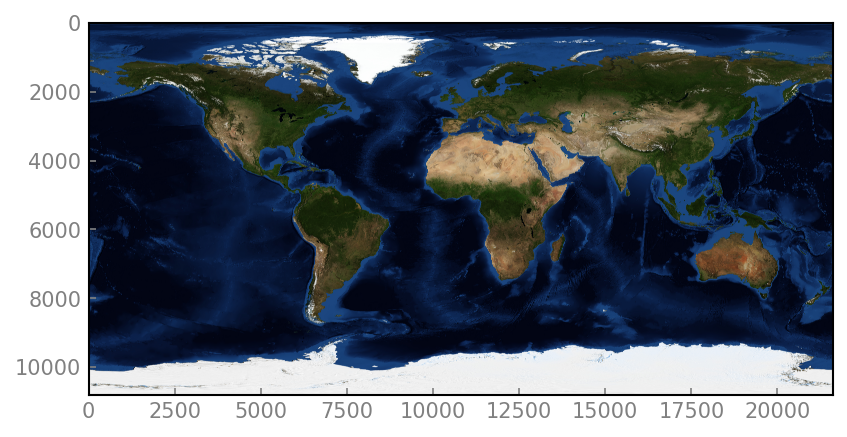

In [104]:
plt.imshow(bm)
plt.show()

In [105]:
from pansat.products.ground_based import mrms, kma
from pansat.products.stations import wegener_net
mrms_domain = mrms.MRMS_DOMAIN.to_shapely()
kma_domain = kma.get_domain().to_shapely()

In [106]:
from pansat.products.stations.wegener_net import get_station_data
from shapely.geometry import Polygon
stations = get_station_data()
lats = stations.latitude.data
lons = stations.longitude.data
lat_min = lats.min()
lat_max = lats.max()
lon_min = lons.min()
lon_max = lons.max()
wegener_net = Polygon([(lon_min, lat_min), (lon_max, lat_min), (lon_max, lat_max), (lon_min, lat_max)])

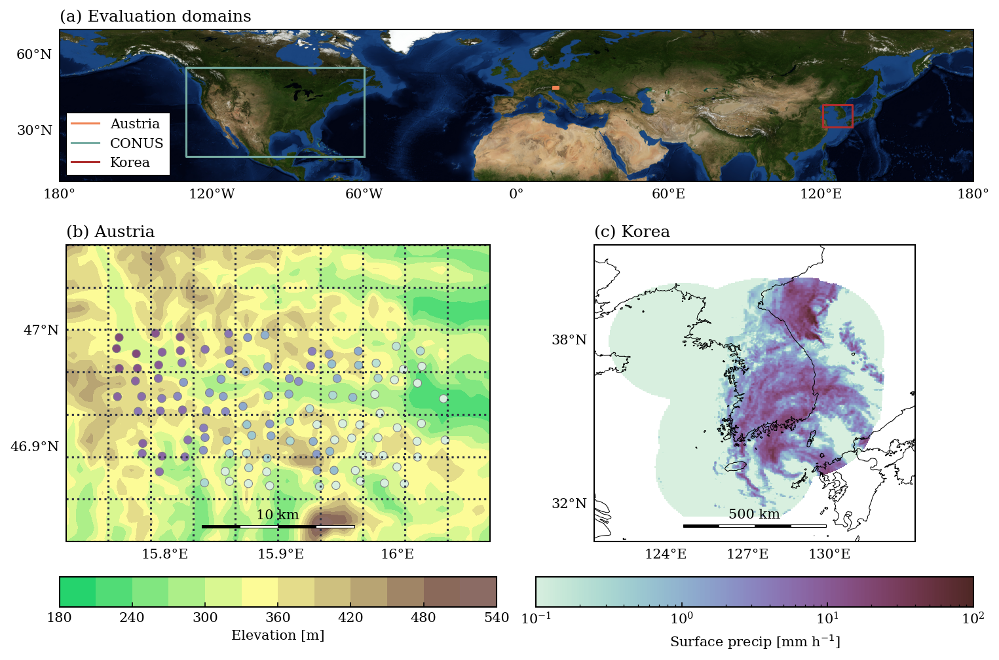

In [108]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from shapely.geometry import Polygon
import cartopy.io.shapereader as shpreader
import geopandas as gpd
from pansat.products.stations.wegener_net import get_station_data
from satrain.plotting import set_style, add_ticks, scale_bar

set_style()

# Define three example Shapely polygons with longitude/latitude coordinates
polygon2 = Polygon([(10, 50), (20, 55), (15, 60), (10, 50)])
polygon3 = Polygon([(-60, -10), (-50, -15), (-55, -20), (-60, -10)])

polygons = {
    "Austria": wegener_net,
    "CONUS": mrms_domain,
    "Korea": kma_domain
}
crs = ccrs.PlateCarree()
# Set up the figure and axis using Cartopy's PlateCarree projection
gs = GridSpec(3, 4, width_ratios=[1.0] * 4, wspace=0.2, height_ratios=[0.7, 1.0, 0.1])
fig = plt.figure(figsize=(12, 8))

ax = fig.add_subplot(gs[0, :4], projection=crs)
ax.imshow(bm, extent=(-180, 180, -90, 90))
# Plot the polygons
for c_ind, (label, polygon) in enumerate(polygons.items()):
    x, y = polygon.exterior.xy  # Extract coordinates
    color = f"C{c_ind + 1}"
    ax.plot(x, y, marker='none', linestyle='-',  label=label, c=color)

ax.set_global()
ax.set_ylim(10, 70)
plt.legend(loc="lower left")
ax.set_title("(a) Evaluation domains", loc="left")
add_ticks(ax, lons=np.arange(-180, 181, 60), lats=np.arange(-90, 90, 30))

import cartopy.io.img_tiles as cimgt


from cartopy.io.img_tiles import GoogleTiles
tiler = GoogleTiles(style="satellite")

ax = fig.add_subplot(gs[1, :2], projection=crs)
ax.set_title("(b) Austria")

norm = LogNorm(1e-1, 1e2)
lons = ref_data_wegener.longitude.data
lons = 0.5 * (lons[1:] + lons[:-1])
lats = ref_data_wegener.latitude.data
lats = 0.5 * (lats[1:] + lats[:-1])
#lats = lats[1:]


ext = area_def.area_extent

ext = (ext[0], ext[2], ext[1], ext[3])

m_elev = plt.contourf(elev.elevation, extent=ext, cmap="terrain", vmin=0, vmax=680, origin="upper", levels=11)
lons = wegener_data.longitude
lats = wegener_data.latitude
sp = np.maximum(wegener_data.surface_precip, 1e-3)
plt.scatter(lons, lats, c=sp, norm=norm, edgecolor="grey", s=36, cmap=cmap_precip)

lon_min = lons.min()
lat_min = lats.min()
lon_max = lons.max()
lat_max = lats.max()

lat_grid = gmi_data_wegener.latitude.data
lat_ctrs = 0.5 * (lat_grid[1:] + lat_grid[:-1])
for lat in lat_ctrs[2:-2]:
    ax.axhline(lat, ls=":", c="C0")
lon_grid = gmi_data_wegener.longitude.data
lon_ctrs = 0.5 * (lon_grid[1:] + lon_grid[:-1])
for lon in lon_ctrs[2:-2]:
    ax.axvline(lon, ls=":", c="C0")

ax.set_ylim(lat_ctrs[-4], lat_ctrs[2])
ax.set_xlim(lon_ctrs[1], lon_ctrs[-2])
scale_bar(ax, 10e3)
add_ticks(ax, lats=[46.9, 47.0], lons=[15.8, 15.9, 16.0])

#
# Korea
#

ax = fig.add_subplot(gs[1, 2:], projection=crs)
ax.set_title("(c) Korea")

lons = gmi_data_kma.longitude.data
lats = gmi_data_kma.latitude.data
sp = np.maximum(ref_data_kma.surface_precip.data, 1e-3)

m_precip = ax.pcolormesh(lons, lats, sp, norm=norm, cmap=cmap_precip)
ax.coastlines()
scale_bar(ax, 500e3)
add_ticks(ax, lats=[32, 38], lons=[124, 127, 130])

cax = fig.add_subplot(gs[2, :2])
plt.colorbar(m_elev, label="Elevation [m]", orientation="horizontal", cax=cax)

cax = fig.add_subplot(gs[2, 2:])
plt.colorbar(m_precip, label="Surface precip [mm h$^{-1}$]", orientation="horizontal", cax=cax)

fig.savefig("../figures/fig06.png", bbox_inches="tight", dpi=300)
fig

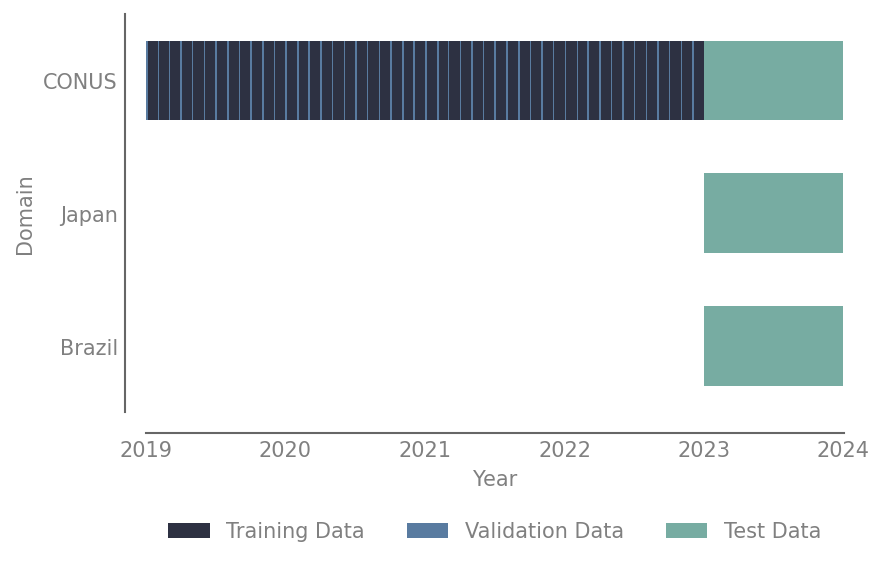

In [92]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime

# Define the time ranges for each dataset
train_start = datetime.datetime(2019, 1, 1)
train_end = datetime.datetime(2022, 12, 31)
val_days = [datetime.datetime(year, month, day) for year in range(2019, 2023)
            for month in range(1, 13) for day in range(1, 5)]
test_start = datetime.datetime(2023, 1, 1)
test_end = datetime.datetime(2023, 12, 31)

# Plotting
fig, ax = plt.subplots(figsize=(6, 4))

# Plot training data for CONUS
train_range = mdates.date2num(train_end) - mdates.date2num(train_start)
train_exclude = sum([4 for year in range(2019, 2023) for month in range(1, 13)])
ax.barh('CONUS', train_range, left=mdates.date2num(train_start), height=0.6, label='Training Data')

for year in range(2019, 2023):
    for month in range(1, 13):
        val_end = datetime.datetime(year, month, 5)
        val_start = datetime.datetime(year, month, 1)
        val_range = mdates.date2num(val_end) - mdates.date2num(val_start)
        ax.barh('CONUS', val_range, left=val_start, facecolor="C4", height=0.6, label="Validation Data")
    
    

# Plot test data for CONUS
ax.barh('CONUS', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")

# Plot test data for Japan and Korea
ax.barh('Japan', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")
ax.barh('Brazil', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")

# Formatting the x-axis
ax.xaxis_date()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Domain')

# Handle legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
legend = plt.legend(by_label.values(), by_label.keys(), ncol=3, bbox_to_anchor=(0.5, -0.3), loc="center")
legend.get_frame().set_linewidth(0)

# Set font to sans-serif
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'DejaVu Sans'
plt.rcParams['text.color'] = 'grey'
plt.rcParams['axes.labelcolor'] = 'grey'
plt.rcParams['xtick.color'] = 'grey'
plt.rcParams['ytick.color'] = 'grey'

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


# Offset panel borders
for spine in ax.spines.values():
    spine.set_position(('outward', 10))
    spine.set_color("#666666")

# Remove axis ticks
ax.xaxis.set_ticks_position('none') 
ax.yaxis.set_ticks_position('none') 
ax.tick_params(axis='both', which='both', length=0)

# Formatting the x-axis
ax.xaxis_date()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

ax.set_ylim(2.5, -0.5)
ax.set_xlim(mdates.date2num(datetime.datetime(2019, 1, 1)), mdates.date2num(datetime.datetime(2024, 1, 1)))

## Handle legend
#handles, labels = plt.gca().get_legend_handles_labels()
#by_label = dict(zip(labels, handles))
#legend = plt.legend(by_label.values(), by_label.keys(), loc='center left', bbox_to_anchor=(1, 0.5))
#legend.get_frame().set_linewidth(0)  # Remove the boundary

# Display the plot
plt.tight_layout()
plt.show()

fig.savefig("../figures/fig07.png", dpi=200, bbox_inches="tight")

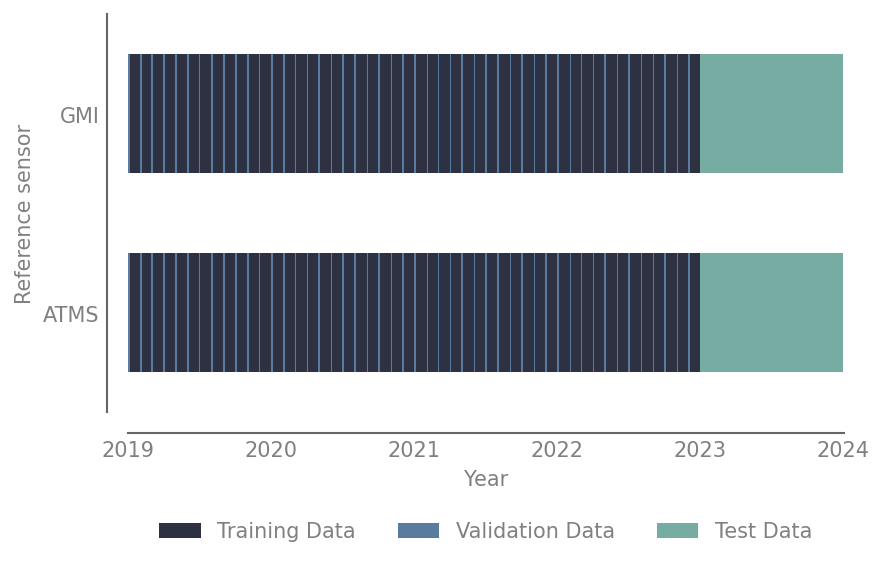

In [68]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime

# Define the time ranges for each dataset
train_start = datetime.datetime(2019, 1, 1)
train_end = datetime.datetime(2022, 12, 31)
val_days = [datetime.datetime(year, month, day) for year in range(2019, 2023)
            for month in range(1, 13) for day in range(1, 5)]
test_start = datetime.datetime(2023, 1, 1)
test_end = datetime.datetime(2023, 12, 31)

# Plotting
fig, ax = plt.subplots(figsize=(6, 4))

# Plot training data for CONUS
train_range = mdates.date2num(train_end) - mdates.date2num(train_start)
train_exclude = sum([4 for year in range(2019, 2023) for month in range(1, 13)])
ax.barh('GMI', train_range, left=mdates.date2num(train_start), height=0.6, label='Training Data', facecolor="C0")

for year in range(2019, 2023):
    for month in range(1, 13):
        val_end = datetime.datetime(year, month, 5)
        val_start = datetime.datetime(year, month, 1)
        val_range = mdates.date2num(val_end) - mdates.date2num(val_start)
        ax.barh('GMI', val_range, left=val_start, facecolor="C4", height=0.6, label="Validation Data")
    
    

# Plot test data for CONUS
ax.barh('GMI', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")

# Plot training data for CONUS
train_range = mdates.date2num(train_end) - mdates.date2num(train_start)
train_exclude = sum([4 for year in range(2019, 2023) for month in range(1, 13)])
ax.barh('ATMS', train_range, left=mdates.date2num(train_start), height=0.6, label='Training Data', facecolor="C0")

for year in range(2019, 2023):
    for month in range(1, 13):
        val_end = datetime.datetime(year, month, 5)
        val_start = datetime.datetime(year, month, 1)
        val_range = mdates.date2num(val_end) - mdates.date2num(val_start)
        ax.barh('ATMS', val_range, left=val_start, facecolor="C4", height=0.6, label="Validation Data")
    
    

# Plot test data for CONUS
ax.barh('ATMS', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")

# Formatting the x-axis
ax.xaxis_date()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Reference sensor')

# Handle legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
legend = plt.legend(by_label.values(), by_label.keys(), ncol=3, bbox_to_anchor=(0.5, -0.3), loc="center")
legend.get_frame().set_linewidth(0)

# Set font to sans-serif
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'DejaVu Sans'
plt.rcParams['text.color'] = 'grey'
plt.rcParams['axes.labelcolor'] = 'grey'
plt.rcParams['xtick.color'] = 'grey'
plt.rcParams['ytick.color'] = 'grey'

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


# Offset panel borders
for spine in ax.spines.values():
    spine.set_position(('outward', 10))
    spine.set_color("#666666")

# Remove axis ticks
ax.xaxis.set_ticks_position('none') 
ax.yaxis.set_ticks_position('none') 
ax.tick_params(axis='both', which='both', length=0)

# Formatting the x-axis
ax.xaxis_date()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

ax.set_ylim(1.5, -0.5)
ax.set_xlim(mdates.date2num(datetime.datetime(2019, 1, 1)), mdates.date2num(datetime.datetime(2024, 1, 1)))

## Handle legend
#handles, labels = plt.gca().get_legend_handles_labels()
#by_label = dict(zip(labels, handles))
#legend = plt.legend(by_label.values(), by_label.keys(), loc='center left', bbox_to_anchor=(1, 0.5))
#legend.get_frame().set_linewidth(0)  # Remove the boundary

# Display the plot
plt.tight_layout()
plt.show()
fig.savefig("../docs/figures/dataset_sensors.png", dpi=200, bbox_inches="tight")

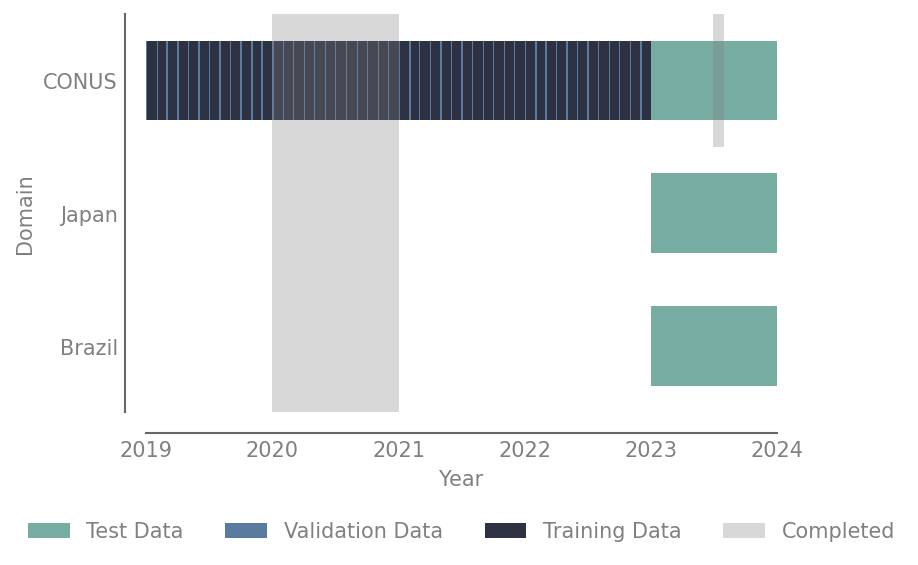

In [69]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime

# Define the time ranges for each dataset
train_start = datetime.datetime(2019, 1, 1)
train_end = datetime.datetime(2022, 12, 31)
val_days = [datetime.datetime(year, month, day) for year in range(2019, 2023)
            for month in range(1, 13) for day in range(1, 5)]
test_start = datetime.datetime(2023, 1, 1)
test_end = datetime.datetime(2023, 12, 31)

# Plotting
fig, ax = plt.subplots(figsize=(6, 4))

# Plot training data for CONUS
train_range = mdates.date2num(train_end) - mdates.date2num(train_start)
train_exclude = sum([4 for year in range(2019, 2023) for month in range(1, 13)])
ax.barh('CONUS', train_range, left=mdates.date2num(train_start), height=0.6, label='Training Data')

for year in range(2019, 2023):
    for month in range(1, 13):
        val_end = datetime.datetime(year, month, 5)
        val_start = datetime.datetime(year, month, 1)
        val_range = mdates.date2num(val_end) - mdates.date2num(val_start)
        ax.barh('CONUS', val_range, left=val_start, facecolor="C4", height=0.6, label="Validation Data")
    
    

# Plot test data for CONUS
ax.barh('CONUS', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")

# Plot test data for Japan and Korea
ax.barh('Japan', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")
ax.barh('Brazil', mdates.date2num(test_end) - mdates.date2num(test_start), left=test_start, height=0.6, label='Test Data', facecolor="C2")

ax.fill_betweenx([-0.5, 2.5], [mdates.date2num(datetime.datetime(2020,1 ,1))] * 2, [mdates.date2num(datetime.datetime(2021, 1, 1))] * 2, facecolor="grey", alpha=0.3, label="Completed")
ax.fill_betweenx([-0.5, 0.5], [mdates.date2num(datetime.datetime(2023,7 ,1))] * 2, [mdates.date2num(datetime.datetime(2023, 8, 1))] * 2, facecolor="grey", alpha=0.3)

# Formatting the x-axis
ax.xaxis_date()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# Adding labels and title
plt.xlabel('Year')
plt.ylabel('Domain')

# Handle legend
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
legend = plt.legend(list(by_label.values())[::-1], list(by_label.keys())[::-1], ncol=4, bbox_to_anchor=(0.5, -0.3), loc="center")
legend.get_frame().set_linewidth(0)

# Set font to sans-serif
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'DejaVu Sans'
plt.rcParams['text.color'] = 'grey'
plt.rcParams['axes.labelcolor'] = 'grey'
plt.rcParams['xtick.color'] = 'grey'
plt.rcParams['ytick.color'] = 'grey'

ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)


# Offset panel borders
for spine in ax.spines.values():
    spine.set_position(('outward', 10))
    spine.set_color("#666666")

# Remove axis ticks
ax.xaxis.set_ticks_position('none') 
ax.yaxis.set_ticks_position('none') 
ax.tick_params(axis='both', which='both', length=0)

# Formatting the x-axis
ax.xaxis_date()
ax.xaxis.set_major_locator(mdates.YearLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

ax.set_ylim(2.5, -0.5)
ax.set_xlim(mdates.date2num(datetime.datetime(2019, 1, 1)), mdates.date2num(datetime.datetime(2024, 1, 1)))

## Handle legend
#handles, labels = plt.gca().get_legend_handles_labels()
#by_label = dict(zip(labels, handles))
#legend = plt.legend(by_label.values(), by_label.keys(), loc='center left', bbox_to_anchor=(1, 0.5))
#legend.get_frame().set_linewidth(0)  # Remove the boundary

# Display the plot
plt.tight_layout()
plt.show()

fig.savefig("../docs/figures/dataset_progress.png", dpi=200, bbox_inches="tight")

## Dataset size

In [135]:
subsets = ["xs", "s", "m", "l", "xl"]
splits = ["training", "validation"]
sources = ["gmi", "geo", "geo_t", "geo_ir", "geo_ir_t", "ancillary", "target"]

In [149]:
import pandas as pd
from tqdm import tqdm
from ipwgml.data import get_local_files

#sizes = {}
subset_df = []
split_df = []
geometry_df = []

sizes_gmi = []
sizes_geo = []
sizes_geo_t = []
sizes_geo_ir = []
sizes_geo_ir_t = []
sizes_anc = []
sizes_target = []
n_files = []


sizes = {}

for geometry in ["gridded", "on_swath"]:
    for subset in tqdm(subsets):
        for split in splits:
            source_sizes = sizes.setdefault(subset, {}).setdefault(split, {})

            print(geometry, split)
                
            files = get_local_files("satrain", "gmi", geometry, split, subset=subset)
            
            subset_df.append(subset)
            split_df.append(split)
            geometry_df.append(geometry)

            n_files.append(len(files["gmi"]))
    
            size_gmi = 0
            for path in files["gmi"]:
                size_gmi += Path(path).stat().st_size
            sizes_gmi.append(size_gmi)
                
            size_geo = 0
            for path in files["geo"]:
                size_geo += Path(path).stat().st_size
            sizes_geo.append(size_geo)
            
            size_geo_t = 0
            for path in files["geo_t"]:
                size_geo_t += Path(path).stat().st_size
            sizes_geo_t.append(size_geo_t)
                
            size_geo_ir = 0
            for path in files["geo_ir"]:
                size_geo_ir += Path(path).stat().st_size
            sizes_geo_ir.append(size_geo_ir)
                
            size_geo_ir_t = 0
            for path in files["geo_ir_t"]:
                size_geo_ir_t += Path(path).stat().st_size
            sizes_geo_ir_t.append(size_geo_ir_t)
            
            size_anc = 0
            for path in files["ancillary"]:
                size_anc += Path(path).stat().st_size
            sizes_anc.append(size_anc)
                
            size_target = 0
            for path in files["target"]:
                size_target += Path(path).stat().st_size
            sizes_target.append(size_target)
    
df = pd.DataFrame({
    "subset": subset_df,
    "split": split_df,
    "geometry": geometry_df,
    "geo_ir": sizes_geo_ir,
    "geo": sizes_geo,
    "gmi": sizes_gmi,
    "geo_ir_t": sizes_geo_ir_t,
    "ancillary": sizes_anc,
    "geo_t": sizes_geo_t,
    "target": sizes_target,
})
df["gmi"] /= 1e9
df["geo"] /= 1e9
df["geo_t"] /= 1e9
df["geo_ir"] /= 1e9
df["geo_ir_t"] /= 1e9
df["ancillary"] /= 1e9
df["target"] /= 1e9
sizes[geometry] = df
    

  0%|                                                                                                                | 0/5 [00:00<?, ?it/s]

gridded training


 20%|████████████████████▊                                                                                   | 1/5 [00:00<00:01,  3.67it/s]

gridded validation
gridded training


 40%|█████████████████████████████████████████▌                                                              | 2/5 [00:00<00:01,  2.34it/s]

gridded validation
gridded training
gridded validation


 60%|██████████████████████████████████████████████████████████████▍                                         | 3/5 [00:02<00:01,  1.01it/s]

gridded training
gridded validation


 80%|███████████████████████████████████████████████████████████████████████████████████▏                    | 4/5 [00:09<00:03,  3.31s/it]

gridded training
gridded validation


  0%|                                                                                                                | 0/5 [00:00<?, ?it/s]

on_swath training


 20%|████████████████████▊                                                                                   | 1/5 [00:00<00:01,  2.62it/s]

on_swath validation
on_swath training


 40%|█████████████████████████████████████████▌                                                              | 2/5 [00:01<00:02,  1.14it/s]

on_swath validation
on_swath training
on_swath validation


 60%|██████████████████████████████████████████████████████████████▍                                         | 3/5 [00:05<00:04,  2.26s/it]

on_swath training
on_swath validation


 80%|███████████████████████████████████████████████████████████████████████████████████▏                    | 4/5 [00:23<00:08,  8.40s/it]

on_swath training
on_swath validation


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:55<00:00, 11.05s/it]


In [150]:
df = pd.DataFrame({
    "subset": subset_df,
    "split": split_df,
    "geometry": geometry_df,
    "ancillary": sizes_anc,
    "geo": sizes_geo,
    "geo_t": sizes_geo_t,
    "geo_ir": sizes_geo_ir,
    "geo_ir_t": sizes_geo_ir_t,
    "gmi": sizes_gmi,
    "target": sizes_target,
    #"n_files": n_files
})
df["gmi"] /= 1e9
df["geo"] /= 1e9
df["geo_t"] /= 1e9
df["geo_ir"] /= 1e9
df["geo_ir_t"] /= 1e9
df["ancillary"] /= 1e9
df["target"] /= 1e9
sizes[geometry] = df
    

In [151]:
df

,subset,split,geometry,ancillary,geo,geo_t,geo_ir,geo_ir_t,gmi,target
0,xs,training,gridded,1.081221,0.835338,3.458296,0.316037,0.385027,0.176703,0.070321
1,xs,validation,gridded,0.158900,0.125232,0.509745,0.048066,0.059233,0.026799,0.010945
2,s,training,gridded,4.504898,3.463164,14.268803,1.316179,1.605595,0.732917,0.292859
3,s,validation,gridded,0.669955,0.531544,2.195392,0.201717,0.247403,0.112366,0.045330
4,m,training,gridded,15.291451,11.791142,48.595103,4.483104,5.511264,2.490702,0.999544
5,m,validation,gridded,2.305174,1.818093,7.509820,0.687687,0.842257,0.382640,0.152107
6,l,training,gridded,49.505299,38.114744,157.193225,14.497656,17.831527,8.050722,3.236134
7,l,validation,gridded,7.578461,5.849337,24.063085,2.225007,2.715076,1.237659,0.490246
8,xl,training,gridded,108.259860,83.309385,343.766442,31.669271,38.977052,17.593234,7.075664
9,xl,validation,gridded,16.609252,12.811994,52.808181,4.864348,5.965228,2.702043,1.070472


In [152]:
df_tr_os = df.loc[(df.geometry == "on_swath") * (df.split == "training")]
df_tr_gr = df.loc[(df.geometry == "gridded") * (df.split == "training")]
df_val_os = df.loc[(df.geometry == "on_swath") * (df.split == "validation")]
df_val_gr = df.loc[(df.geometry == "gridded") * (df.split == "validation")]

In [153]:
df_tr_os

,subset,split,geometry,ancillary,geo,geo_t,geo_ir,geo_ir_t,gmi,target
10,xs,training,on_swath,0.312815,0.188487,0.615247,0.108441,0.132688,0.124142,0.106631
12,s,training,on_swath,1.304575,0.782514,2.544653,0.451606,0.553250,0.517100,0.443874
14,m,training,on_swath,4.442714,2.657059,8.618926,1.536701,1.881060,1.760126,1.510816
16,l,training,on_swath,14.331895,8.592136,27.861588,4.968245,6.080851,5.691475,4.882835
18,xl,training,on_swath,31.311686,18.773908,60.918039,10.851767,13.281505,12.429476,10.665744


In [154]:
df_tr_os

,subset,split,geometry,ancillary,geo,geo_t,geo_ir,geo_ir_t,gmi,target
10,xs,training,on_swath,0.312815,0.188487,0.615247,0.108441,0.132688,0.124142,0.106631
12,s,training,on_swath,1.304575,0.782514,2.544653,0.451606,0.553250,0.517100,0.443874
14,m,training,on_swath,4.442714,2.657059,8.618926,1.536701,1.881060,1.760126,1.510816
16,l,training,on_swath,14.331895,8.592136,27.861588,4.968245,6.080851,5.691475,4.882835
18,xl,training,on_swath,31.311686,18.773908,60.918039,10.851767,13.281505,12.429476,10.665744


In [156]:
df_tr_os = df_tr_os.melt(id_vars=["subset", "geometry", "split"], var_name="source", value_name="size") 
df_tr_gr = df_tr_gr.melt(id_vars=["subset", "geometry", "split"], var_name="source", value_name="size") 
df_val_os = df_val_os.melt(id_vars=["subset", "geometry", "split"], var_name="source", value_name="size") 
df_val_gr = df_val_gr.melt(id_vars=["subset", "geometry", "split"], var_name="source", value_name="size") 

In [157]:
domains = ["austria", "conus", "korea"]
splits = ["testing"]
sources = ["gmi", "geo", "geo_t", "geo_ir", "geo_ir_t", "ancillary", "target"]

In [158]:
import pandas as pd
from tqdm import tqdm
from ipwgml.data import get_local_files

#sizes = {}
domain_df = []
split_df = []
geometry_df = []

sizes_gmi = []
sizes_geo = []
sizes_geo_t = []
sizes_geo_ir = []
sizes_geo_ir_t = []
sizes_anc = []
sizes_target = []
n_files = []


sizes = {}

for geometry in ["gridded", "on_swath"]:
    for domain in tqdm(domains):
        for split in splits:
            source_sizes = sizes.setdefault(domain, {}).setdefault(split, {})

            print(geometry, split)
                
            files = get_local_files("satrain", "gmi", geometry, split, domain=domain)
            
            domain_df.append(domain)
            split_df.append(split)
            geometry_df.append(geometry)

            n_files.append(len(files["gmi"]))
    
            size_gmi = 0
            for path in files["gmi"]:
                size_gmi += Path(path).stat().st_size
            sizes_gmi.append(size_gmi)
                
            size_geo = 0
            for path in files["geo"]:
                size_geo += Path(path).stat().st_size
            sizes_geo.append(size_geo)
            
            size_geo_t = 0
            for path in files["geo_t"]:
                size_geo_t += Path(path).stat().st_size
            sizes_geo_t.append(size_geo_t)
                
            size_geo_ir = 0
            for path in files["geo_ir"]:
                size_geo_ir += Path(path).stat().st_size
            sizes_geo_ir.append(size_geo_ir)
                
            size_geo_ir_t = 0
            for path in files["geo_ir_t"]:
                size_geo_ir_t += Path(path).stat().st_size
            sizes_geo_ir_t.append(size_geo_ir_t)
            
            size_anc = 0
            for path in files["ancillary"]:
                size_anc += Path(path).stat().st_size
            sizes_anc.append(size_anc)
                
            size_target = 0
            for path in files["target"]:
                size_target += Path(path).stat().st_size
            sizes_target.append(size_target)
    
df = pd.DataFrame({
    "domain": domain_df,
    "split": split_df,
    "geometry": geometry_df,
    "geo_ir": sizes_geo_ir,
    "geo": sizes_geo,
    "gmi": sizes_gmi,
    "geo_ir_t": sizes_geo_ir_t,
    "ancillary": sizes_anc,
    "geo_t": sizes_geo_t,
    "target": sizes_target,
    #"n_files": n_files
})
df["gmi"] /= 1e9
df["geo"] /= 1e9
df["geo_t"] /= 1e9
df["geo_ir"] /= 1e9
df["geo_ir_t"] /= 1e9
df["ancillary"] /= 1e9
df["target"] /= 1e9
sizes[geometry] = df
    

 33%|██████████████████████████████████▋                                                                     | 1/3 [00:00<00:00,  7.23it/s]

gridded testing
gridded testing


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:01<00:00,  1.65it/s]


gridded testing


  0%|                                                                                                                | 0/3 [00:00<?, ?it/s]

on_swath testing
on_swath testing


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00,  4.54it/s]

on_swath testing


In [159]:
df_test_os = df.loc[(df.geometry == "on_swath") * (df.split == "testing")]
df_test_gr = df.loc[(df.geometry == "gridded") * (df.split == "testing")]

In [160]:
df

,domain,split,geometry,geo_ir,geo,gmi,geo_ir_t,ancillary,geo_t,target
0,austria,testing,gridded,0.231538,0.455540,0.114015,0.264870,0.727967,1.607913,0.016787
1,conus,testing,gridded,15.353987,38.581460,4.499372,19.291541,48.833053,158.329131,2.280263
2,korea,testing,gridded,0.447347,1.263522,0.228456,0.551935,0.796398,5.417712,0.058702
3,austria,testing,on_swath,0.278990,0.471187,0.288413,0.341616,0.642457,1.325552,0.264938
4,conus,testing,on_swath,4.097302,6.669123,4.220969,5.013570,8.917766,18.240785,2.269397
5,korea,testing,on_swath,0.525274,1.038420,0.545072,0.685240,1.129487,3.591518,0.769937


In [161]:
df_test_os = df_test_os.melt(id_vars=["domain", "geometry", "split"], var_name="source", value_name="size") 
df_test_gr = df_test_gr.melt(id_vars=["domain", "geometry", "split"], var_name="source", value_name="size") 

In [162]:
df_test_os

,domain,geometry,split,source,size
0,austria,on_swath,testing,geo_ir,0.278990
1,conus,on_swath,testing,geo_ir,4.097302
2,korea,on_swath,testing,geo_ir,0.525274
3,austria,on_swath,testing,geo,0.471187
4,conus,on_swath,testing,geo,6.669123
5,korea,on_swath,testing,geo,1.038420
6,austria,on_swath,testing,gmi,0.288413
7,conus,on_swath,testing,gmi,4.220969
8,korea,on_swath,testing,gmi,0.545072
9,austria,on_swath,testing,geo_ir_t,0.341616


In [163]:
df_val_os

,subset,geometry,split,source,size
0,xs,on_swath,validation,ancillary,0.048703
1,s,on_swath,validation,ancillary,0.199908
2,m,on_swath,validation,ancillary,0.680057
3,l,on_swath,validation,ancillary,2.187920
4,xl,on_swath,validation,ancillary,4.782186
5,xs,on_swath,validation,geo,0.028616
6,s,on_swath,validation,geo,0.119653
7,m,on_swath,validation,geo,0.406423
8,l,on_swath,validation,geo,1.314612
9,xl,on_swath,validation,geo,2.873064


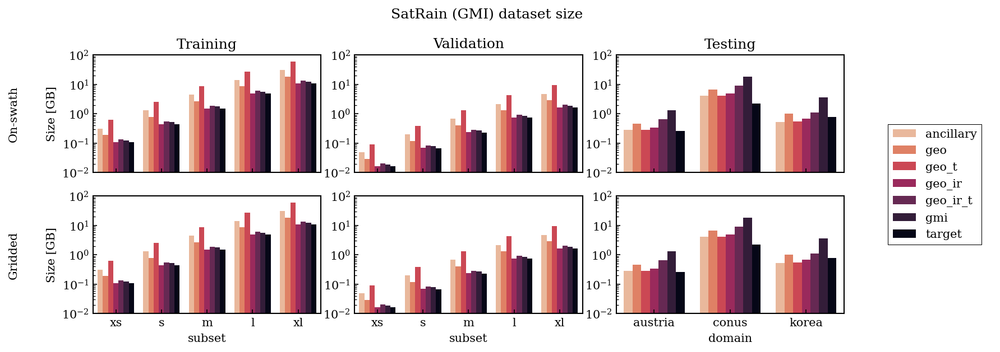

In [183]:
import seaborn as sns
from matplotlib.gridspec import GridSpec
from ipwgml.plotting import cmap_precip, cmap_tbs

palette = [cmap_tbs(val) for val in np.linspace(0, 1, 8)[:-1][::-1]]

gs = GridSpec(2, 5, width_ratios=[0.2, 1.0, 1.0, 1.0, 0.5])
fig = plt.figure(figsize=(15, 4))

ax = fig.add_subplot(gs[0, 0])
ax.set_axis_off()
ax.text(0, 0, "On-swath", rotation=90, ha="center", va="center")
ax.set_ylim(-2, 2)

ax = fig.add_subplot(gs[0, 1])
sns.barplot(df_tr_os, x="subset", hue="source", y="size", legend=True, palette=palette)
ax.set_yscale("log")
ax.set_ylabel("Size [GB]")
ax.set_ylim(1e-2, 1e2)
ax.set_xlabel("")
ax.set_xticklabels([])
handles, labels = ax.get_legend_handles_labels()
ax.legend_.remove()
ax.set_title("Training", loc="center")

ax = fig.add_subplot(gs[0, 2])
sns.barplot(df_val_os, x="subset", hue="source", y="size", legend=False, palette=palette)
ax.set_yscale("log")
ax.set_ylabel(None)
ax.set_ylim(1e-2, 1e2)
ax.set_xlabel("")
ax.set_xticklabels([])
ax.set_title("Validation", loc="center")

ax = fig.add_subplot(gs[0, 3])
sns.barplot(df_test_os, x="domain", hue="source", y="size", legend=False, palette=palette)
ax.set_yscale("log")
ax.set_ylabel("Size [GB]")
ax.set_ylabel(None)
ax.set_ylim(1e-2, 1e2)
ax.set_xlabel("")
ax.set_xticklabels([])
ax.set_title("Testing", loc="center")

ax = fig.add_subplot(gs[1, 0])
ax.set_axis_off()
ax.text(0, 0, "Gridded", rotation=90, ha="center", va="center")
ax.set_ylim(-2, 2)

ax = fig.add_subplot(gs[1, 1])
sns.barplot(df_tr_os, x="subset", hue="source", y="size", legend=False, palette=palette)
ax.set_yscale("log")
ax.set_ylabel("Size [GB]")
ax.set_ylim(1e-2, 1e2)

ax = fig.add_subplot(gs[1, 2])
sns.barplot(df_val_os, x="subset", hue="source", y="size", legend=False, palette=palette)
ax.set_yscale("log")
ax.set_ylabel(None)
ax.set_ylim(1e-2, 1e2)

ax = fig.add_subplot(gs[1, 3])
sns.barplot(df_test_os, x="domain", hue="source", y="size", legend=False, palette=palette)
ax.set_yscale("log")
ax.set_ylabel("Size [GB]")
ax.set_ylabel(None)
ax.set_ylim(1e-2, 1e2)

fig.suptitle("SatRain (GMI) dataset size", y=1.02)

lax = fig.add_subplot(gs[:, -1])
lax.set_axis_off()
lax.legend(handles=handles, labels=labels, loc="center")

In [43]:
df

,domain,split,geometry,ancillary,geo,geo_t,geo_ir,geo_ir_t,gmi,target,n_files
0,austria,testing,gridded,0.727967,0.455540,1.607913,231538205,0.264870,0.114015,0.016787,397
1,conus,testing,gridded,48.833053,38.581460,158.329131,15353986766,19.291541,4.499372,2.280263,2912
2,korea,testing,gridded,0.796398,1.263522,5.417712,447346978,0.551935,0.228456,0.058702,600
3,austria,testing,on_swath,0.642457,0.471187,1.325552,278989777,0.341616,0.288413,0.264938,397
4,conus,testing,on_swath,8.917766,6.669123,18.240785,4097302328,5.013570,4.220969,2.269397,2912
5,korea,testing,on_swath,1.129487,1.038420,3.591518,525274480,0.685240,0.545072,0.769937,600


In [51]:
df_test = df.melt(id_vars=["domain", "split", "geometry"], var_name="source")

In [31]:
df_tr = df
df_val = df.groupby("subset").sum().reindex(["xs", "s", "m", "l", "xl"])

In [55]:
df_test

,domain,split,geometry,source,value
0,austria,testing,gridded,ancillary,7.279666e-01
1,conus,testing,gridded,ancillary,4.883305e+01
2,korea,testing,gridded,ancillary,7.963982e-01
3,austria,testing,on_swath,ancillary,6.424574e-01
4,conus,testing,on_swath,ancillary,8.917766e+00
5,korea,testing,on_swath,ancillary,1.129487e+00
6,austria,testing,gridded,geo,4.555403e-01
7,conus,testing,gridded,geo,3.858146e+01
8,korea,testing,gridded,geo,1.263522e+00
9,austria,testing,on_swath,geo,4.711867e-01


<Axes: xlabel='domain', ylabel='value'>

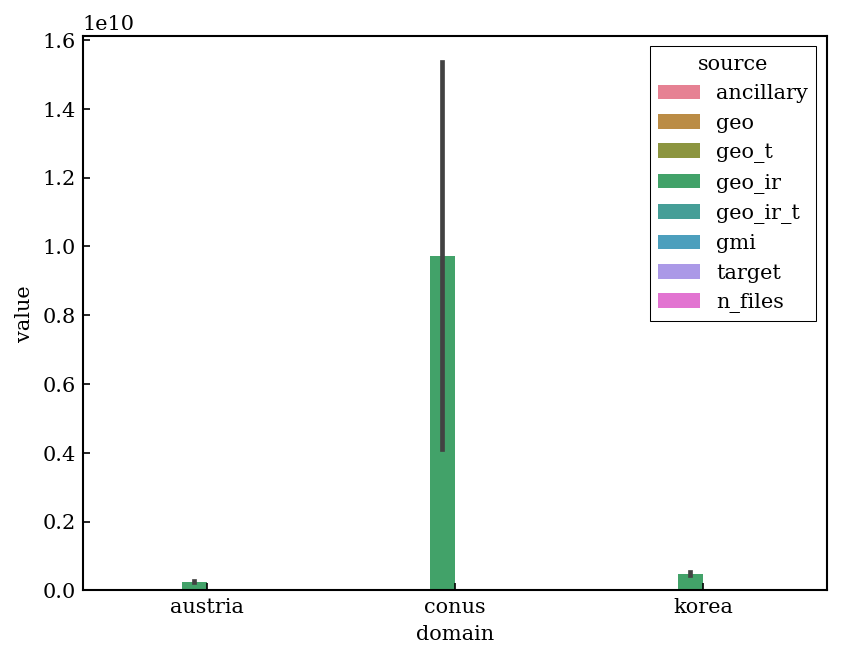

In [58]:
import seaborn as sns
sns.barplot(df_test, x="domain", hue="source", y="value")

Text(0, 0.5, 'Size [GB]')

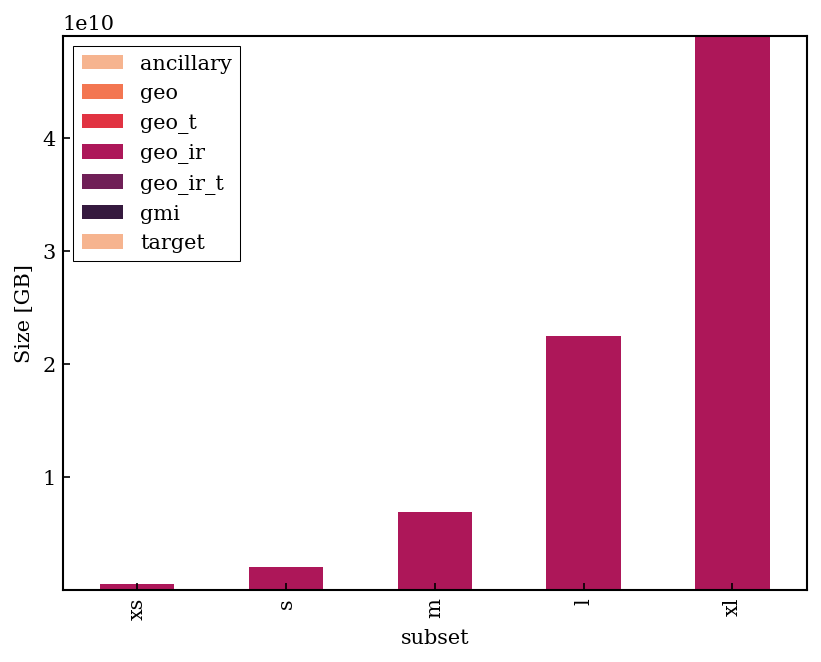

In [32]:
import seaborn as sns
ax = df_tr.plot.bar(stacked=True, color=palette)
ax.set_ylabel("Size [GB]")
#ax.set_yscale("log")


In [136]:
df

,split,ancillary,geo,geo_ir,gmi,target
subset,,,,,,
l,trainingvalidationtesting,56.529151,178.834813,20.320597,9.166267,3.682998
m,trainingvalidationtesting,17.457548,55.335297,6.280542,2.838380,1.138172
s,trainingvalidationtesting,5.110142,16.266929,1.837044,0.834445,0.330815
xl,trainingvalidationtesting,123.281198,391.031536,44.420135,20.040395,8.047234
xs,trainingvalidationtesting,1.222855,3.904446,0.435882,0.199747,0.079996


NameError: name 'training' is not defined